In [87]:
#import packages and image data
import numpy as np
import math
import matplotlib.pyplot as plt
import scipy.io as spio
import scipy.sparse.linalg as ll
import sklearn.preprocessing as skpp
import pandas as pd
from scipy import sparse
import sklearn.utils.graph_shortest_path as sk
import scipy.sparse.linalg as ll
from PIL import Image
import zipfile
from zipfile import ZipFile


#import Mars orbital images
# specifying the zip file name
file_name = "map-proj.zip"
#create a data array of images where each row is a vectorized version of an image
archive = zipfile.ZipFile('map-proj.zip', 'r')
imagefile = archive.open(archive.namelist()[0])
img=Image.open(imagefile)
numpydata = np.asarray(img)
data=numpydata.reshape(1, 227*227) #create first row of data
# create the rest of the rows of data
with ZipFile(file_name, 'r') as zip:
    for i in range(1,3823):
        imagefile = zip.open(zip.namelist()[i])
        img=Image.open(imagefile)
        numpydata = np.asarray(img)
        imgarray=numpydata.reshape(1, 227*227)
        data=np.concatenate((data,imgarray), axis=0)

#remove the rows 791, 951, 3809 because they have no labels
data = np.delete(data,[791,951,3809],0)
# archive = zipfile.ZipFile('map-proj.zip', 'r')
# imgfile = archive.open('map-proj/PSP_009754_2205_RED-0031.jpg')
# imgfile

# pic=data[0,:]
# pic=np.reshape(pic,(227,227))
# pic = (pic).astype(np.uint8)
# im = Image.fromarray(pic,mode='L')

#im.show()
#im.save('result.png')

In [88]:
#see a sample image
pic=data[0,:]
pic=np.reshape(pic,(227,227))

im = Image.fromarray(pic,mode='L')
im.show()

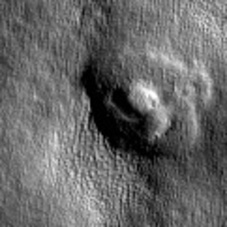

In [3]:
#see a sample image (alternative way of retrieving image)
archive = zipfile.ZipFile('map-proj.zip', 'r')
imgfile = archive.open('map-proj/ESP_011283_2265_RED-0032.jpg')
img=Image.open(imgfile)
img

In [4]:
#list of image names and the number of images
#archive.namelist(),len(archive.namelist()) 

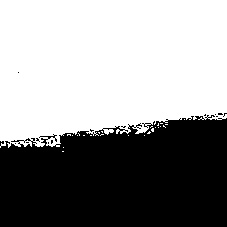

In [5]:
#an image that seems problematic; this is one of the images we deleted from data
archive = zipfile.ZipFile('map-proj.zip', 'r')
imgfile = archive.open('map-proj/thresh-1-ESP_027199_1975_RED-0013.jpg')
imgfile
img=Image.open(imgfile)
img


In [89]:
#create a dictionary that maps label to category name
class_map = {0: 'other',
             1: 'crater',
             2: 'dark_dune',
             3: 'streak',
             4: 'bright_dune',
             5: 'impact',
             6: 'edge'}

# create reverse dictionary
reverse_class_map = {v: k for k,v in class_map.items()}


In [90]:
#upload the labels as pd dataframe
labels_df = pd.read_csv('labels-map-proj.txt', sep=" ", header=None)
labels_df.columns = ["name",'label']
labels_df

,name,label
0,ESP_017541_1600_RED-0103.jpg,6
1,ESP_016715_2025_RED-0077.jpg,6
2,ESP_017541_1600_RED-0117.jpg,6
3,ESP_027199_1975_RED-0141.jpg,6
4,ESP_027199_1975_RED-0160.jpg,6
...,...,...
3815,ESP_038343_1785_RED-0200.jpg,0
3816,ESP_025163_1890_RED-0185.jpg,0
3817,PSP_010461_1845_RED-0152.jpg,0
3818,ESP_018784_2050_RED-0074.jpg,0


In [91]:
#create an np array of labels that corresponds to the rows in data (labels_df is in different order from data)
#also print out the three rows that have no label
labels_list=[]
for i in range(3823):
    name = archive.namelist()[i].split('map-proj/')[1] 
    if name in set(labels_df['name']):
        labels_list.append([int(labels_df.loc[labels_df['name']==name]['label'])])
    else:
        print(i)
labels=np.array(labels_list)


791
951
3809


In [92]:
#create dataset consisting of 'crater', 'dark dune', 'streak', and 'bright dune' only
indices_main=np.where(labels==[1,2,3,4])[0]
data_main=data[indices_main]
labels_main=labels[indices_main] #create corresponding labels for data_main

#create dataset for only the 'other' category
indices_other=np.where(labels==0)[0]
data_other=data[indices_other]
labels_other=labels[indices_other] #create corresponding labels for data_other

#create dataset for only the 'crater' category
indices_crater=np.where(labels==1)[0]
data_crater=data[indices_crater]
labels_crater=labels[indices_crater] #create corresponding labels for data_crater

#create dataset for only the 'dark dune' category
indices_dark=np.where(labels==2)[0]
data_dark=data[indices_dark]
labels_dark=labels[indices_dark] #create corresponding labels for data_dark

#create dataset for only the 'bright dune' category
indices_bright=np.where(labels==4)[0]
data_bright=data[indices_bright]
labels_bright=labels[indices_bright] #create corresponding labels for data_bright

#create dataset for only the 'streak' category
indices_streak=np.where(labels==3)[0]
data_streak=data[indices_streak]
labels_streak=labels[indices_streak] #create corresponding labels for data_streak

In [10]:
#scale data_main by 255
data_iso=data_main/255

In [11]:
#Perform ISOMAP algorithm on data_main
m=970 #the number of nodes
EPSILON=50  #50 seems good

In [12]:
np.linalg.norm(data_iso[43,:]-data_iso[19,:])

44.482996505241765

In [13]:
#Perform ISOMAP algorithm

#STEP 1: Create the weighted adjacency matrix A

weights=[]
for i in range(m):
    for j in range(m):
        if j>i:
            if np.linalg.norm(data_iso[i,:]-data_iso[j,:])<=EPSILON:
                w=np.linalg.norm(data_iso[i,:]-data_iso[j,:])
                weights.append([i,j,w])
            else:
                weights.append([i,j,0])

weights=np.array(weights) 
i=weights[:,0]
j=weights[:,1]
v=weights[:,2]
A = sparse.coo_matrix((v, (i, j)), shape=(m,m))
A = (A + np.transpose(A))  #to make sure A is symmetric
A = sparse.csc_matrix.todense(A) # convert to dense matrix

#STEP 2: Compute the shortest distance matrix D
from scipy.sparse.csgraph import shortest_path
D=shortest_path(csgraph=A,directed=False)

# #sample graph for debugging purposes
# A=np.array([[0,1,0,0],[1,0,1,1],[0,1,0,0],[0,1,0,0]])
D= sk.graph_shortest_path(A)

#STEP 3: Compute matrix C
H=np.eye(m)-(1/m)*np.dot(np.matrix(np.ones(m)).T,np.matrix(np.ones(m)))
C=(-1/2)*(H@(D**2)@H)

#STEP 4: Eigendecomposition of C

K = 2 #set the number of dimensions
S,W = ll.eigs(C,k = K)  #eigendecomposition of C;  W[:, i] is the eigenvector corresponding to the eigenvalue S[i].  
                        #S and W are already sorted beginning with the largest eigenvalue
#ignore the complex parts since S and W consist of real numbers
S = S.real 
W = W.real
Z_T=W @ np.diag(np.sqrt(S))  
Z=Z_T.T  #compute the scores
dim1=Z[0,:]
dim2=Z[1,:]

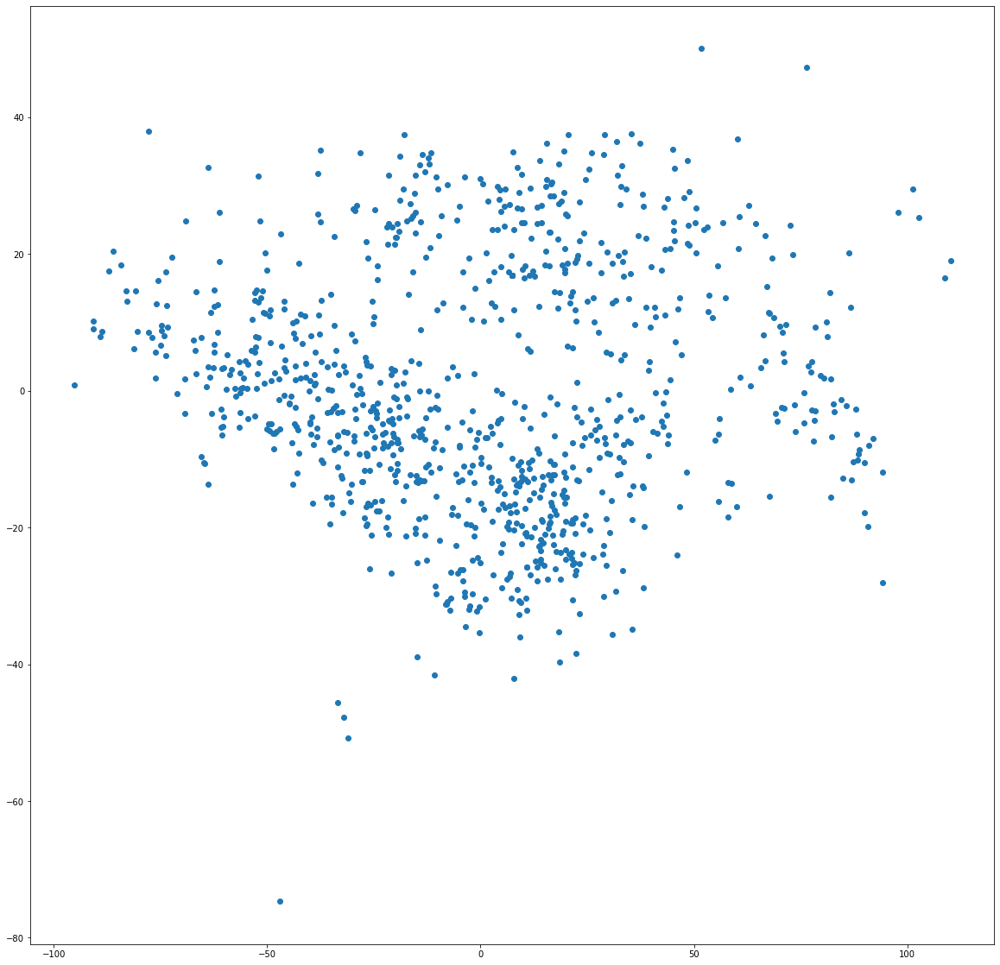

In [14]:
#plotting the data in the low-dimensional space
from matplotlib.offsetbox import AnnotationBbox, OffsetImage
plt.figure(1,figsize=(20,20)) #enlarge the plot
plt.scatter(dim1,dim2)

<ipython-input-15-503e004c3500>:8: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.subplot(111)


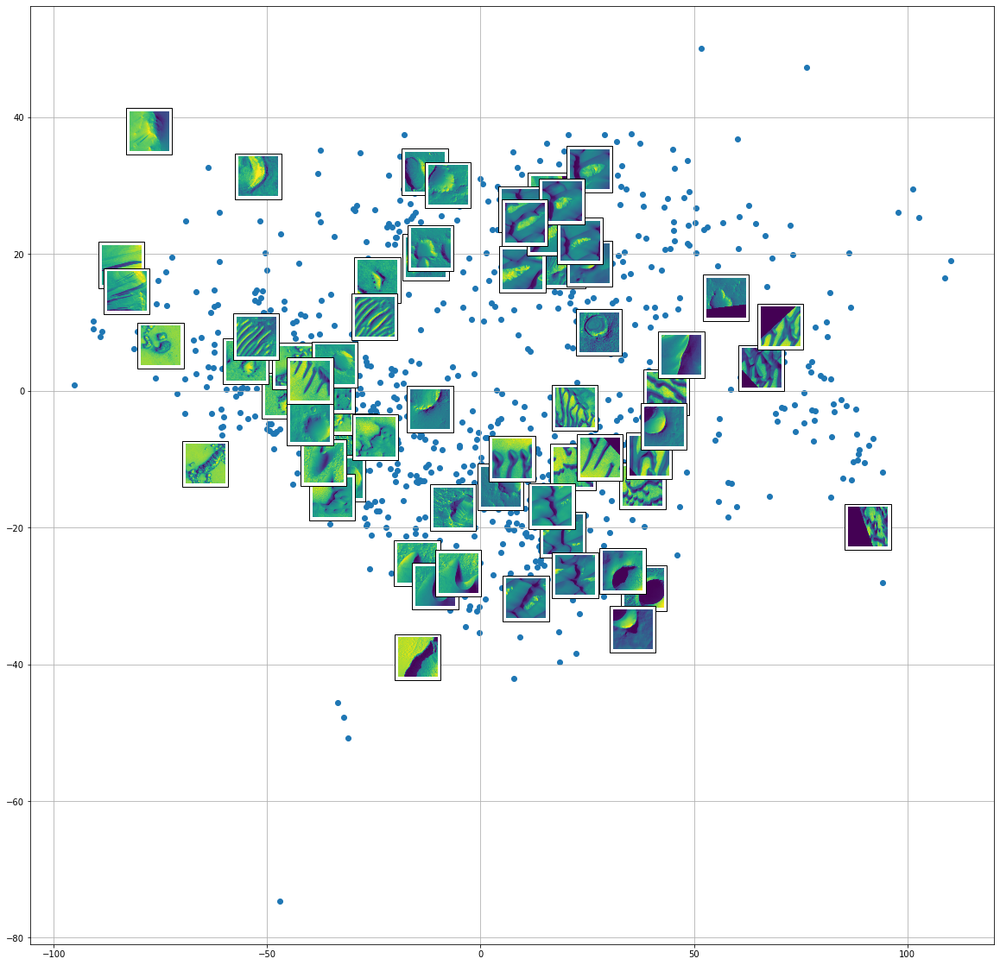

In [15]:
#plotting the data in the low-dimensional space
from matplotlib.offsetbox import AnnotationBbox, OffsetImage
plt.figure(1,figsize=(20,20)) #enlarge the plot
plt.scatter(dim1,dim2)

#Add pictures of orbital images to scatter plot
for i in range(0,m,15): 
    ax = plt.subplot(111)
    pic=data_iso[i,:]
    pic=np.reshape(pic,(227,227))
    pic = (pic*255).astype(np.uint8)
    im = Image.fromarray(pic,mode='L')
    #im = im.rotate(-90)  #rotate the image by 90 degrees
    imagebox = OffsetImage(im, zoom=.20) #.2 is good zoom size
    xy = [dim1[i], dim2[i]]               # coordinates to position this image

    ab = AnnotationBbox(imagebox, xy,
        xybox=(.3, -.3),
        xycoords='data',
        boxcoords="offset points")                                  
    ax.add_artist(ab)
ax.grid(True)
plt.draw()
plt.show()

In [16]:
np.where(labels_main==4)[0]

array([122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 143, 144, 145,
       146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158,
       159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 174, 175,
       176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 187, 188, 189,
       190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202,
       203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215,
       216, 217, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230,
       231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243,
       244, 245, 246, 247, 248, 336, 337, 338, 339, 340, 341, 343, 344,
       346, 347, 348, 350, 352, 355, 356, 359, 361, 449, 450, 451, 458,
       460, 461, 462, 463, 464, 465, 466, 467, 468, 469, 470, 471, 472,
       473, 474, 475, 476, 477, 478, 479, 480, 707, 709, 711, 712, 741],
      dtype=int64)

In [17]:
#see a sample image
pic=data_iso[122,:]
pic=np.reshape(pic,(227,227))
pic = (pic*255).astype(np.uint8)
im = Image.fromarray(pic,mode='L')
im.show()

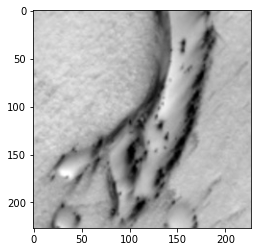

In [18]:
#see a sample image (alternative way)
pic=data_iso[122,:]
pic=np.reshape(pic,(227,227))

fig, axes = plt.subplots(figsize=(4,4))
axes.imshow(pic, cmap='gray')
plt.show()

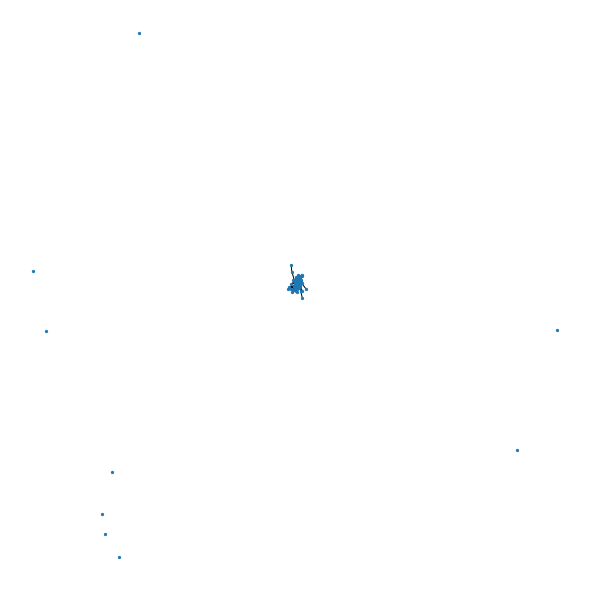

In [19]:
#Plotting the adjacency graph

# importing the required module
import networkx as nx

# making a graph.
G = nx.from_numpy_matrix(A)
random_pos = nx.random_layout(G, seed=40) #40
pos = nx.spring_layout(G, pos=random_pos)
plt.figure(1,figsize=(8,8)) #enlarge the plot
nx.draw(G,pos,node_size=5) 
plt.draw()
plt.show()

In [20]:
list(nx.isolates(G))

[10, 127, 154, 167, 493, 514, 521, 603, 669]

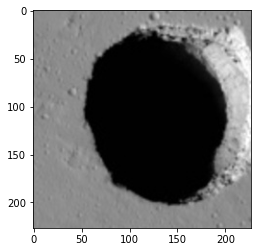

In [21]:
#see a sample image (alternative way)
pic=data_iso[10,:]
pic=np.reshape(pic,(227,227))

fig, axes = plt.subplots(figsize=(4,4))
axes.imshow(pic, cmap='gray')
plt.show()

In [22]:
#see a sample image
pic=data_iso[669,:]
pic=np.reshape(pic,(227,227))
pic = (pic*255).astype(np.uint8)
im = Image.fromarray(pic,mode='L')
im.show()

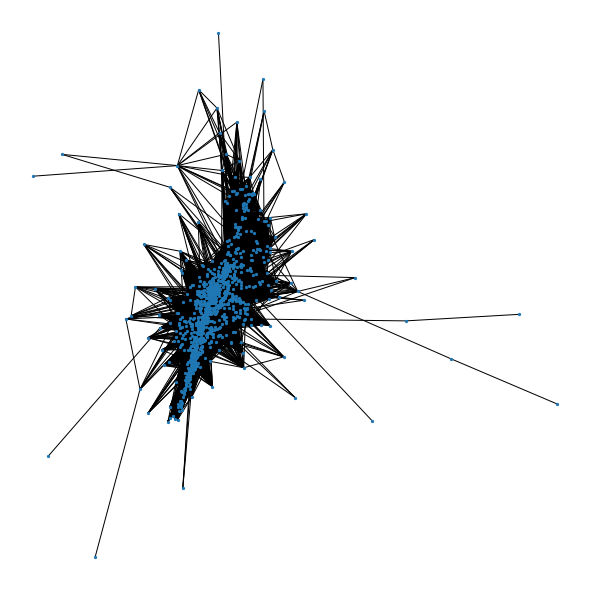

In [23]:

#Plotting the adjacency graph after removing isolated nodes

# importing the required module
import networkx as nx

# making a graph.
G = nx.from_numpy_matrix(A)
G.remove_nodes_from(list(nx.isolates(G)))
random_pos = nx.random_layout(G, seed=40) #40
pos = nx.spring_layout(G, pos=random_pos)
plt.figure(1,figsize=(8,8)) #enlarge the plot
nx.draw(G,pos,node_size=5) 
plt.draw()
plt.show()

<ipython-input-24-22ff7d68dcb4>:34: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.subplot(111)


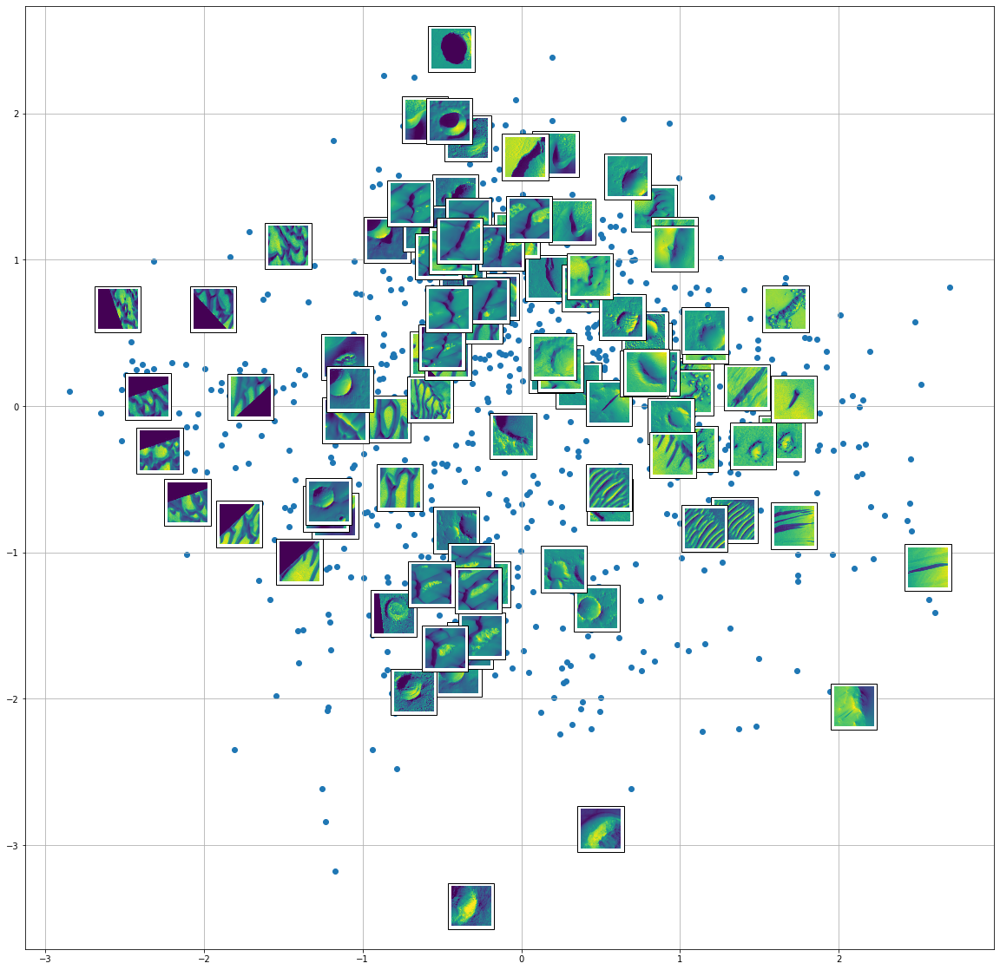

In [24]:
#Perform PCA on our images

import numpy as np
import math
import matplotlib.pyplot as plt
import scipy.io as spio
import scipy.sparse.linalg as ll
import sklearn.preprocessing as skpp

data_pca=data_main.T/255  #each column of data is now an image; the data is also scaled by 255

#Perform PCA

#estimate the mean mu
mu = np.mean(data_pca,axis = 1)
xc = data_pca - mu[:,None] #subtract mu from each x^i; xc has columns x^i-mu
C = np.dot(xc,xc.T)/m  #covariance matrix
K = 2 #set the number of principal components
S,W = ll.eigs(C,k = K)  #eigendecomposition of C;  W[:, i] is the eigenvector corresponding to the eigenvalue S[i].  
                        #S and W are already sorted beginning with the largest eigenvalue
#ignore the complex parts since S and W consist of real numbers
S = S.real 
W = W.real

dim1 = np.dot(W[:,0].T,xc)/math.sqrt(S[0]) # the scores z11,...,zm1 of the first principal component
dim2 = np.dot(W[:,1].T,xc)/math.sqrt(S[1]) # the scores z12,...,zm2 of the second principal component

#plot the scatter plot
plt.figure(1,figsize=(20,20)) #enlarge the plot
plt.scatter(dim1,dim2)

#Add pictures of faces to scatter plot
for i in range(0,m,10):
    ax = plt.subplot(111)
    pic=data_pca[:,i]
    pic=np.reshape(pic,(227,227))
    pic = (pic * 255).astype(np.uint8)
    im = Image.fromarray(pic,mode='L')
    #im = im.rotate(-90)  #rotate the image by 90 degrees
    imagebox = OffsetImage(im, zoom=.2)
    xy = [dim1[i], dim2[i]]               # coordinates to position this image

    ab = AnnotationBbox(imagebox, xy,
        xybox=(.3, -.3),
        xycoords='data',
        boxcoords="offset points")                                  
    ax.add_artist(ab)
ax.grid(True)
plt.draw()
plt.show()

In [25]:
np.linalg.norm(data_iso[43,:]-data_iso[19,:]), data_crater.shape

(44.482996505241765, (369, 51529))

<ipython-input-26-304d96184e33>:64: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.subplot(111)


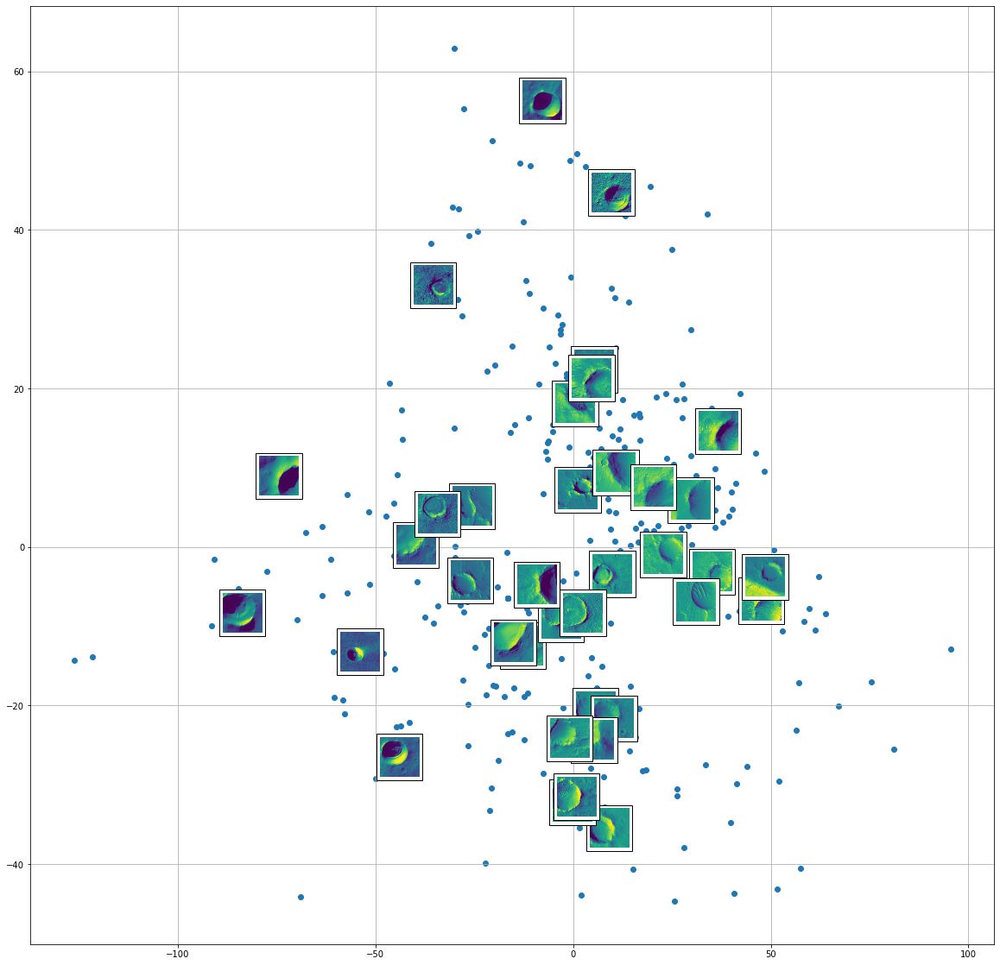

In [26]:
#Perform ISOMAP on only crater images

#scale data_crater by 255
data_iso=data_crater/255

#Perform ISOMAP algorithm on data_main
m=data_iso.shape[0] #the number of nodes
EPSILON=50  #50 seems good

#Perform ISOMAP algorithm

#STEP 1: Create the weighted adjacency matrix A

weights=[]
for i in range(m):
    for j in range(m):
        if j>i:
            if np.linalg.norm(data_iso[i,:]-data_iso[j,:])<=EPSILON:
                w=np.linalg.norm(data_iso[i,:]-data_iso[j,:])
                weights.append([i,j,w])
            else:
                weights.append([i,j,0])

weights=np.array(weights) 
i=weights[:,0]
j=weights[:,1]
v=weights[:,2]
A = sparse.coo_matrix((v, (i, j)), shape=(m,m))
A = (A + np.transpose(A))  #to make sure A is symmetric
A = sparse.csc_matrix.todense(A) # convert to dense matrix

#STEP 2: Compute the shortest distance matrix D
from scipy.sparse.csgraph import shortest_path
D=shortest_path(csgraph=A,directed=False)

# #sample graph for debugging purposes
# A=np.array([[0,1,0,0],[1,0,1,1],[0,1,0,0],[0,1,0,0]])
D= sk.graph_shortest_path(A)

#STEP 3: Compute matrix C
H=np.eye(m)-(1/m)*np.dot(np.matrix(np.ones(m)).T,np.matrix(np.ones(m)))
C=(-1/2)*(H@(D**2)@H)

#STEP 4: Eigendecomposition of C

K = 2 #set the number of dimensions
S,W = ll.eigs(C,k = K)  #eigendecomposition of C;  W[:, i] is the eigenvector corresponding to the eigenvalue S[i].  
                        #S and W are already sorted beginning with the largest eigenvalue
#ignore the complex parts since S and W consist of real numbers
S = S.real 
W = W.real
Z_T=W @ np.diag(np.sqrt(S))  
Z=Z_T.T  #compute the scores
dim1=Z[0,:]
dim2=Z[1,:]

#plotting the data in the low-dimensional space
from matplotlib.offsetbox import AnnotationBbox, OffsetImage
plt.figure(1,figsize=(20,20)) #enlarge the plot
plt.scatter(dim1,dim2)

#Add pictures of orbital images to scatter plot
for i in range(0,m,10): 
    ax = plt.subplot(111)
    pic=data_iso[i,:]
    pic=np.reshape(pic,(227,227))
    pic = (pic*255).astype(np.uint8)
    im = Image.fromarray(pic,mode='L')
    #im = im.rotate(-90)  #rotate the image by 90 degrees
    imagebox = OffsetImage(im, zoom=.20) #.2 is good zoom size
    xy = [dim1[i], dim2[i]]               # coordinates to position this image

    ab = AnnotationBbox(imagebox, xy,
        xybox=(.3, -.3),
        xycoords='data',
        boxcoords="offset points")                                  
    ax.add_artist(ab)
ax.grid(True)
plt.draw()
plt.show()

<ipython-input-27-cf6bcaee41ba>:34: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.subplot(111)


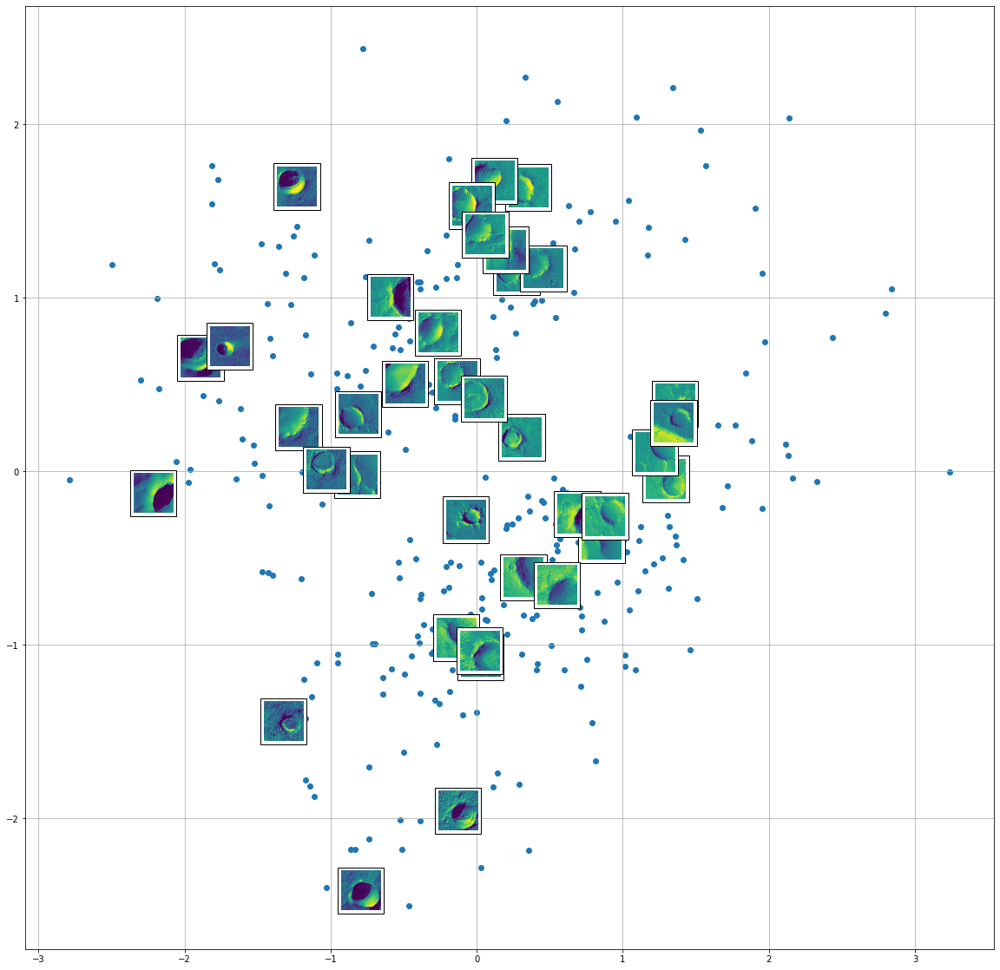

In [27]:
#Perform PCA on only crater images

import numpy as np
import math
import matplotlib.pyplot as plt
import scipy.io as spio
import scipy.sparse.linalg as ll
import sklearn.preprocessing as skpp

data_pca=data_crater.T/255  #each column of data is now an image; the data is also scaled by 255

#Perform PCA

#estimate the mean mu
mu = np.mean(data_pca,axis = 1)
xc = data_pca - mu[:,None] #subtract mu from each x^i; xc has columns x^i-mu
C = np.dot(xc,xc.T)/m  #covariance matrix
K = 2 #set the number of principal components
S,W = ll.eigs(C,k = K)  #eigendecomposition of C;  W[:, i] is the eigenvector corresponding to the eigenvalue S[i].  
                        #S and W are already sorted beginning with the largest eigenvalue
#ignore the complex parts since S and W consist of real numbers
S = S.real 
W = W.real

dim1 = np.dot(W[:,0].T,xc)/math.sqrt(S[0]) # the scores z11,...,zm1 of the first principal component
dim2 = np.dot(W[:,1].T,xc)/math.sqrt(S[1]) # the scores z12,...,zm2 of the second principal component

#plot the scatter plot
plt.figure(1,figsize=(20,20)) #enlarge the plot
plt.scatter(dim1,dim2)

#Add pictures of faces to scatter plot
for i in range(0,m,10):
    ax = plt.subplot(111)
    pic=data_pca[:,i]
    pic=np.reshape(pic,(227,227))
    pic = (pic * 255).astype(np.uint8)
    im = Image.fromarray(pic,mode='L')
    #im = im.rotate(-90)  #rotate the image by 90 degrees
    imagebox = OffsetImage(im, zoom=.2)
    xy = [dim1[i], dim2[i]]               # coordinates to position this image

    ab = AnnotationBbox(imagebox, xy,
        xybox=(.3, -.3),
        xycoords='data',
        boxcoords="offset points")                                  
    ax.add_artist(ab)
ax.grid(True)
plt.draw()
plt.show()

In [28]:
data_iso=data_dark/255
np.linalg.norm(data_iso[43,:]-data_iso[19,:]), data_dark.shape

(49.51359643793185, (408, 51529))

<ipython-input-29-662f8b41b08f>:64: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.subplot(111)


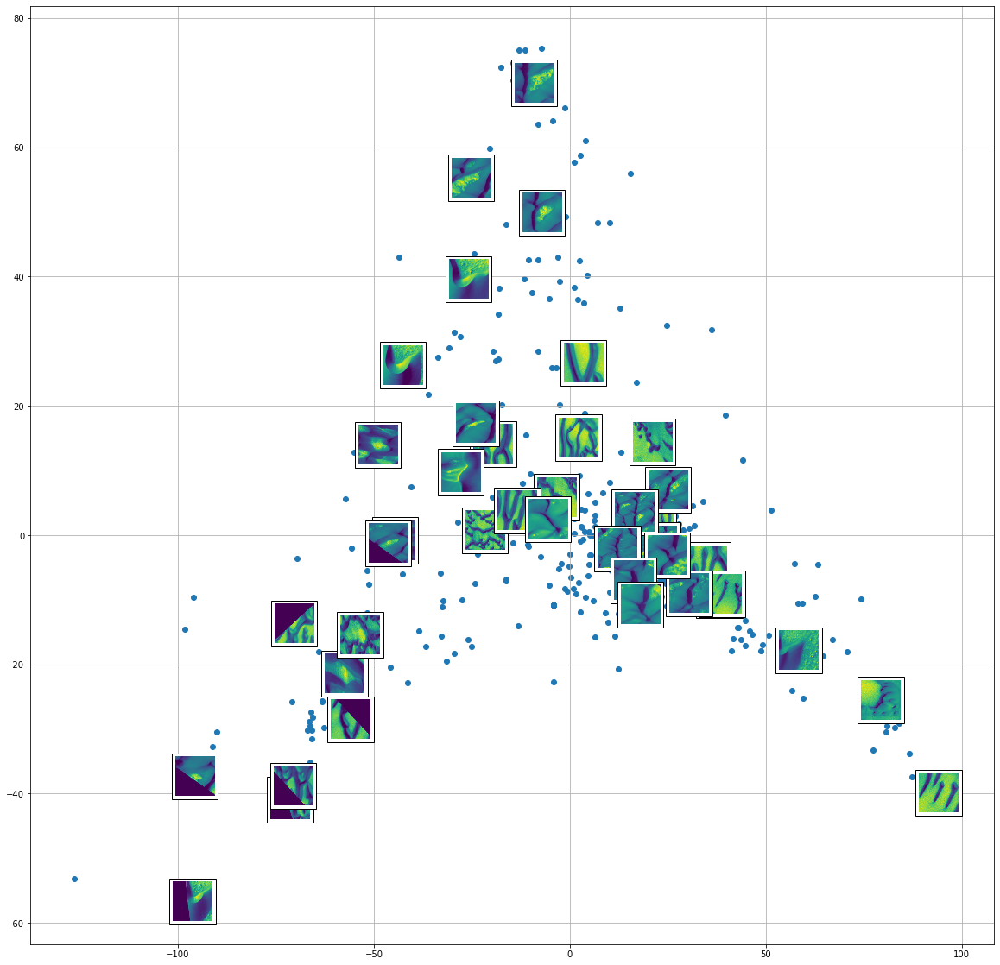

In [29]:
#Perform ISOMAP on only dark_dune images

#scale data_dark by 255
data_iso=data_dark/255

#Perform ISOMAP algorithm on data_main
m=data_iso.shape[0] #the number of nodes
EPSILON=45  #50 seems good

#Perform ISOMAP algorithm

#STEP 1: Create the weighted adjacency matrix A

weights=[]
for i in range(m):
    for j in range(m):
        if j>i:
            if np.linalg.norm(data_iso[i,:]-data_iso[j,:])<=EPSILON:
                w=np.linalg.norm(data_iso[i,:]-data_iso[j,:])
                weights.append([i,j,w])
            else:
                weights.append([i,j,0])

weights=np.array(weights) 
i=weights[:,0]
j=weights[:,1]
v=weights[:,2]
A = sparse.coo_matrix((v, (i, j)), shape=(m,m))
A = (A + np.transpose(A))  #to make sure A is symmetric
A = sparse.csc_matrix.todense(A) # convert to dense matrix

#STEP 2: Compute the shortest distance matrix D
from scipy.sparse.csgraph import shortest_path
D=shortest_path(csgraph=A,directed=False)

# #sample graph for debugging purposes
# A=np.array([[0,1,0,0],[1,0,1,1],[0,1,0,0],[0,1,0,0]])
D= sk.graph_shortest_path(A)

#STEP 3: Compute matrix C
H=np.eye(m)-(1/m)*np.dot(np.matrix(np.ones(m)).T,np.matrix(np.ones(m)))
C=(-1/2)*(H@(D**2)@H)

#STEP 4: Eigendecomposition of C

K = 2 #set the number of dimensions
S,W = ll.eigs(C,k = K)  #eigendecomposition of C;  W[:, i] is the eigenvector corresponding to the eigenvalue S[i].  
                        #S and W are already sorted beginning with the largest eigenvalue
#ignore the complex parts since S and W consist of real numbers
S = S.real 
W = W.real
Z_T=W @ np.diag(np.sqrt(S))  
Z=Z_T.T  #compute the scores
dim1=Z[0,:]
dim2=Z[1,:]

#plotting the data in the low-dimensional space
from matplotlib.offsetbox import AnnotationBbox, OffsetImage
plt.figure(1,figsize=(20,20)) #enlarge the plot
plt.scatter(dim1,dim2)

#Add pictures of orbital images to scatter plot
for i in range(0,m,10): 
    ax = plt.subplot(111)
    pic=data_iso[i,:]
    pic=np.reshape(pic,(227,227))
    pic = (pic*255).astype(np.uint8)
    im = Image.fromarray(pic,mode='L')
    #im = im.rotate(-90)  #rotate the image by 90 degrees
    imagebox = OffsetImage(im, zoom=.20) #.2 is good zoom size
    xy = [dim1[i], dim2[i]]               # coordinates to position this image

    ab = AnnotationBbox(imagebox, xy,
        xybox=(.3, -.3),
        xycoords='data',
        boxcoords="offset points")                                  
    ax.add_artist(ab)
ax.grid(True)
plt.draw()
plt.show()

<ipython-input-30-afa4e3710c72>:34: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.subplot(111)


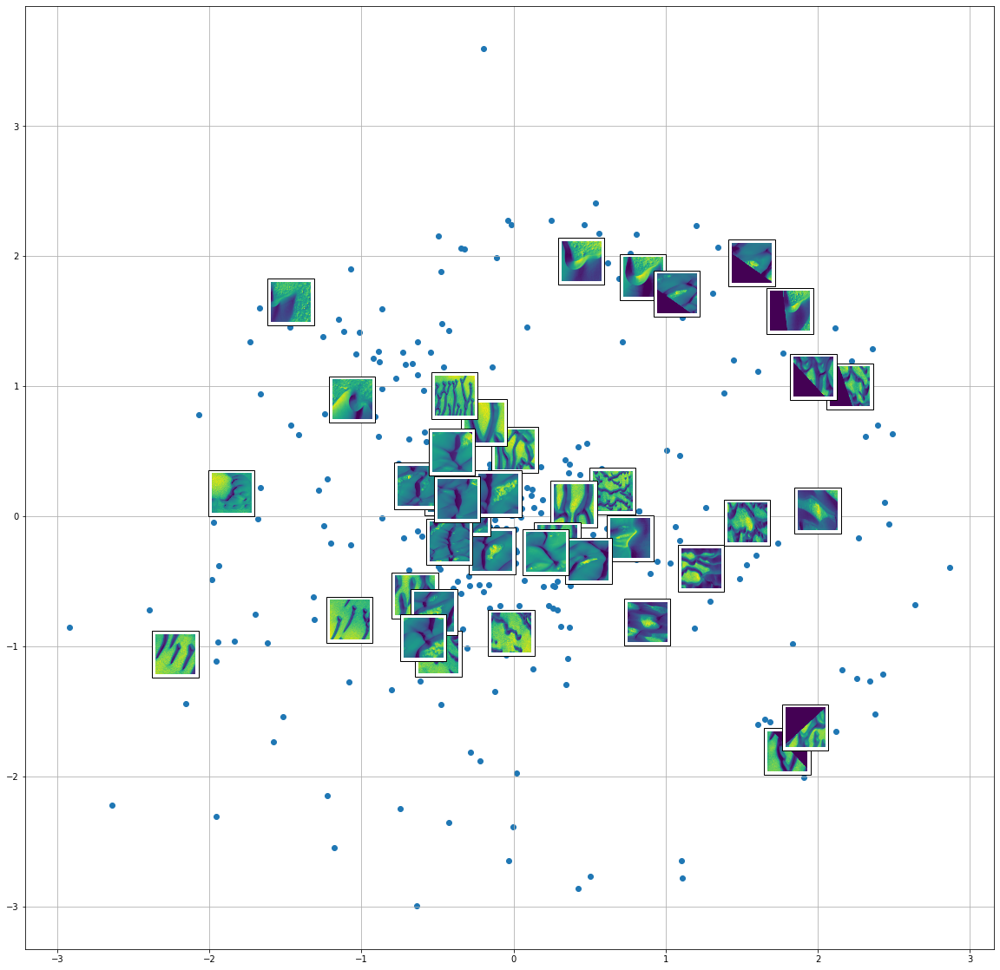

In [30]:
#Perform PCA on only dark_dune images

import numpy as np
import math
import matplotlib.pyplot as plt
import scipy.io as spio
import scipy.sparse.linalg as ll
import sklearn.preprocessing as skpp

data_pca=data_dark.T/255  #each column of data is now an image; the data is also scaled by 255

#Perform PCA

#estimate the mean mu
mu = np.mean(data_pca,axis = 1)
xc = data_pca - mu[:,None] #subtract mu from each x^i; xc has columns x^i-mu
C = np.dot(xc,xc.T)/m  #covariance matrix
K = 2 #set the number of principal components
S,W = ll.eigs(C,k = K)  #eigendecomposition of C;  W[:, i] is the eigenvector corresponding to the eigenvalue S[i].  
                        #S and W are already sorted beginning with the largest eigenvalue
#ignore the complex parts since S and W consist of real numbers
S = S.real 
W = W.real

dim1 = np.dot(W[:,0].T,xc)/math.sqrt(S[0]) # the scores z11,...,zm1 of the first principal component
dim2 = np.dot(W[:,1].T,xc)/math.sqrt(S[1]) # the scores z12,...,zm2 of the second principal component

#plot the scatter plot
plt.figure(1,figsize=(20,20)) #enlarge the plot
plt.scatter(dim1,dim2)

#Add pictures of faces to scatter plot
for i in range(0,m,10):
    ax = plt.subplot(111)
    pic=data_pca[:,i]
    pic=np.reshape(pic,(227,227))
    pic = (pic * 255).astype(np.uint8)
    im = Image.fromarray(pic,mode='L')
    #im = im.rotate(-90)  #rotate the image by 90 degrees
    imagebox = OffsetImage(im, zoom=.2)
    xy = [dim1[i], dim2[i]]               # coordinates to position this image

    ab = AnnotationBbox(imagebox, xy,
        xybox=(.3, -.3),
        xycoords='data',
        boxcoords="offset points")                                  
    ax.add_artist(ab)
ax.grid(True)
plt.draw()
plt.show()

In [31]:
data_iso=data_bright/255
np.linalg.norm(data_iso[43,:]-data_iso[19,:]), data_bright.shape

(54.61928953855286, (156, 51529))

<ipython-input-32-1465d8b5ac04>:64: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.subplot(111)


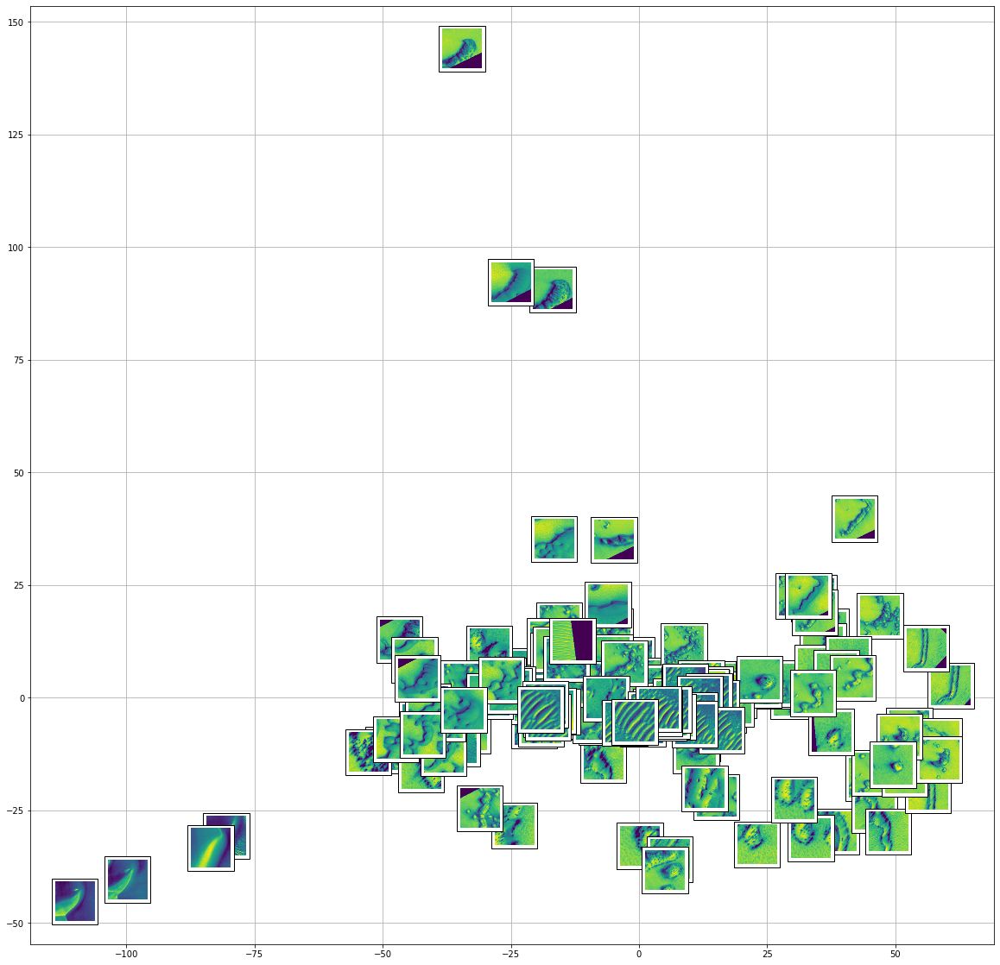

In [32]:
#Perform ISOMAP on only bright_dune images

#scale data_bright by 255
data_iso=data_bright/255

#Perform ISOMAP algorithm on data_main
m=data_iso.shape[0] #the number of nodes
EPSILON=55  #50 seems good

#Perform ISOMAP algorithm

#STEP 1: Create the weighted adjacency matrix A

weights=[]
for i in range(m):
    for j in range(m):
        if j>i:
            if np.linalg.norm(data_iso[i,:]-data_iso[j,:])<=EPSILON:
                w=np.linalg.norm(data_iso[i,:]-data_iso[j,:])
                weights.append([i,j,w])
            else:
                weights.append([i,j,0])

weights=np.array(weights) 
i=weights[:,0]
j=weights[:,1]
v=weights[:,2]
A = sparse.coo_matrix((v, (i, j)), shape=(m,m))
A = (A + np.transpose(A))  #to make sure A is symmetric
A = sparse.csc_matrix.todense(A) # convert to dense matrix

#STEP 2: Compute the shortest distance matrix D
from scipy.sparse.csgraph import shortest_path
D=shortest_path(csgraph=A,directed=False)

# #sample graph for debugging purposes
# A=np.array([[0,1,0,0],[1,0,1,1],[0,1,0,0],[0,1,0,0]])
D= sk.graph_shortest_path(A)

#STEP 3: Compute matrix C
H=np.eye(m)-(1/m)*np.dot(np.matrix(np.ones(m)).T,np.matrix(np.ones(m)))
C=(-1/2)*(H@(D**2)@H)

#STEP 4: Eigendecomposition of C

K = 2 #set the number of dimensions
S,W = ll.eigs(C,k = K)  #eigendecomposition of C;  W[:, i] is the eigenvector corresponding to the eigenvalue S[i].  
                        #S and W are already sorted beginning with the largest eigenvalue
#ignore the complex parts since S and W consist of real numbers
S = S.real 
W = W.real
Z_T=W @ np.diag(np.sqrt(S))  
Z=Z_T.T  #compute the scores
dim1=Z[0,:]
dim2=Z[1,:]

#plotting the data in the low-dimensional space
from matplotlib.offsetbox import AnnotationBbox, OffsetImage
plt.figure(1,figsize=(20,20)) #enlarge the plot
plt.scatter(dim1,dim2)

#Add pictures of orbital images to scatter plot
for i in range(0,m,1): 
    ax = plt.subplot(111)
    pic=data_iso[i,:]
    pic=np.reshape(pic,(227,227))
    pic = (pic*255).astype(np.uint8)
    im = Image.fromarray(pic,mode='L')
    #im = im.rotate(-90)  #rotate the image by 90 degrees
    imagebox = OffsetImage(im, zoom=.20) #.2 is good zoom size
    xy = [dim1[i], dim2[i]]               # coordinates to position this image

    ab = AnnotationBbox(imagebox, xy,
        xybox=(.3, -.3),
        xycoords='data',
        boxcoords="offset points")                                  
    ax.add_artist(ab)
ax.grid(True)
plt.draw()
plt.show()

<ipython-input-33-4b2f499e53d8>:34: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.subplot(111)


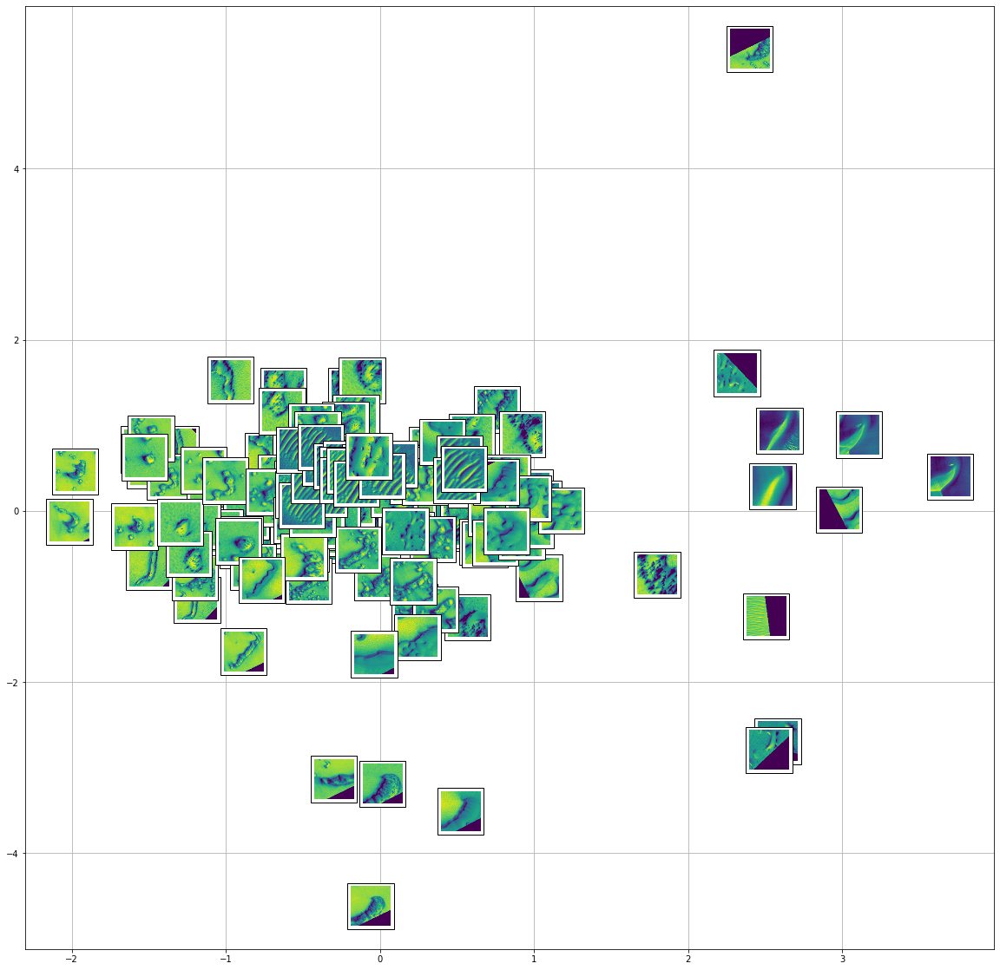

In [33]:
#Perform PCA on only bright_dune images

import numpy as np
import math
import matplotlib.pyplot as plt
import scipy.io as spio
import scipy.sparse.linalg as ll
import sklearn.preprocessing as skpp

data_pca=data_bright.T/255  #each column of data is now an image; the data is also scaled by 255

#Perform PCA

#estimate the mean mu
mu = np.mean(data_pca,axis = 1)
xc = data_pca - mu[:,None] #subtract mu from each x^i; xc has columns x^i-mu
C = np.dot(xc,xc.T)/m  #covariance matrix
K = 2 #set the number of principal components
S,W = ll.eigs(C,k = K)  #eigendecomposition of C;  W[:, i] is the eigenvector corresponding to the eigenvalue S[i].  
                        #S and W are already sorted beginning with the largest eigenvalue
#ignore the complex parts since S and W consist of real numbers
S = S.real 
W = W.real

dim1 = np.dot(W[:,0].T,xc)/math.sqrt(S[0]) # the scores z11,...,zm1 of the first principal component
dim2 = np.dot(W[:,1].T,xc)/math.sqrt(S[1]) # the scores z12,...,zm2 of the second principal component

#plot the scatter plot
plt.figure(1,figsize=(20,20)) #enlarge the plot
plt.scatter(dim1,dim2)

#Add pictures of faces to scatter plot
for i in range(0,m,1):
    ax = plt.subplot(111)
    pic=data_pca[:,i]
    pic=np.reshape(pic,(227,227))
    pic = (pic * 255).astype(np.uint8)
    im = Image.fromarray(pic,mode='L')
    #im = im.rotate(-90)  #rotate the image by 90 degrees
    imagebox = OffsetImage(im, zoom=.2)
    xy = [dim1[i], dim2[i]]               # coordinates to position this image

    ab = AnnotationBbox(imagebox, xy,
        xybox=(.3, -.3),
        xycoords='data',
        boxcoords="offset points")                                  
    ax.add_artist(ab)
ax.grid(True)
plt.draw()
plt.show()

In [34]:
data_iso=data_streak/255
np.linalg.norm(data_iso[3,:]-data_iso[19,:]), data_streak.shape

(23.73385462667654, (37, 51529))

<ipython-input-46-195f86ac0941>:52: RuntimeWarning: invalid value encountered in sqrt
  Z_T=W @ np.diag(np.sqrt(S))
<ipython-input-46-195f86ac0941>:64: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.subplot(111)


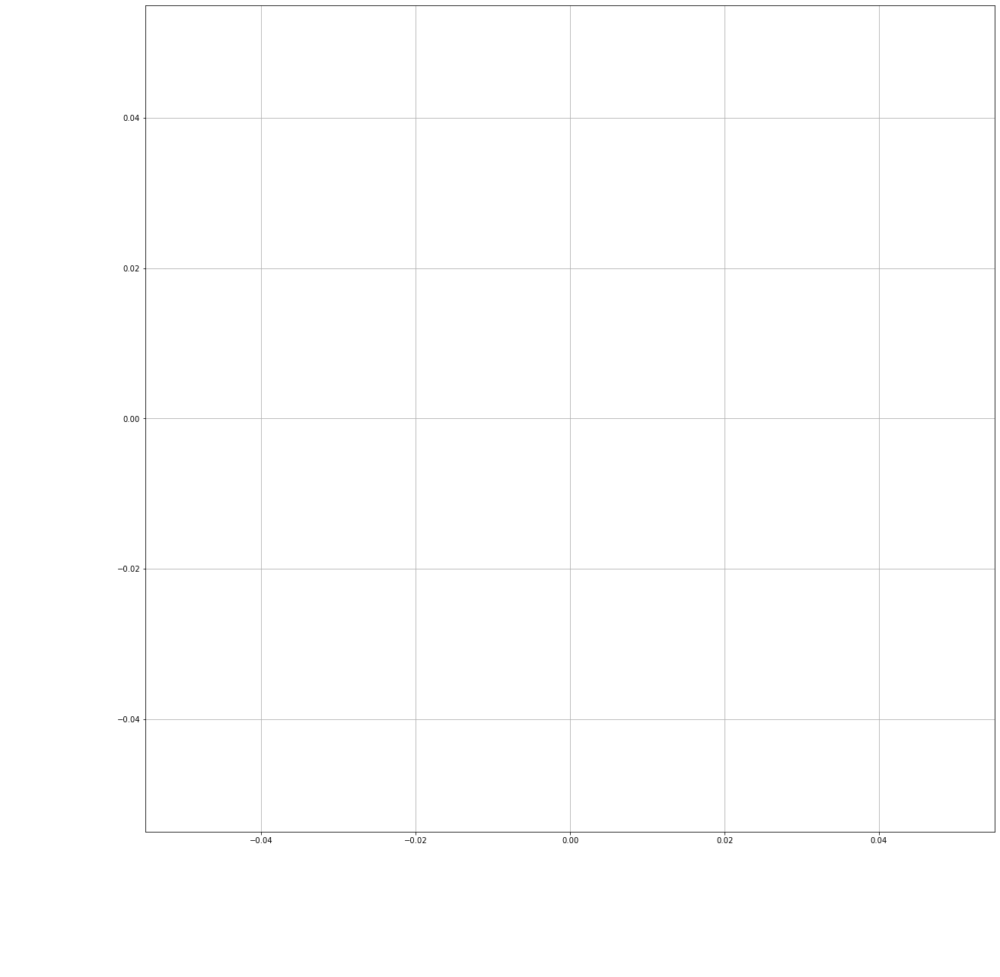

In [46]:
#Perform ISOMAP on only streak images

#scale data_streak by 255
data_iso=data_streak/255

#Perform ISOMAP algorithm on data_main
m=data_iso.shape[0] #the number of nodes
EPSILON=20  #50 seems good

#Perform ISOMAP algorithm

#STEP 1: Create the weighted adjacency matrix A

weights=[]
for i in range(m):
    for j in range(m):
        if j>i:
            if np.linalg.norm(data_iso[i,:]-data_iso[j,:])<=EPSILON:
                w=np.linalg.norm(data_iso[i,:]-data_iso[j,:])
                weights.append([i,j,w])
            else:
                weights.append([i,j,0])

weights=np.array(weights) 
i=weights[:,0]
j=weights[:,1]
v=weights[:,2]
A = sparse.coo_matrix((v, (i, j)), shape=(m,m))
A = (A + np.transpose(A))  #to make sure A is symmetric
A = sparse.csc_matrix.todense(A) # convert to dense matrix

#STEP 2: Compute the shortest distance matrix D
from scipy.sparse.csgraph import shortest_path
D=shortest_path(csgraph=A,directed=False)

# #sample graph for debugging purposes
# A=np.array([[0,1,0,0],[1,0,1,1],[0,1,0,0],[0,1,0,0]])
D= sk.graph_shortest_path(A)

#STEP 3: Compute matrix C
H=np.eye(m)-(1/m)*np.dot(np.matrix(np.ones(m)).T,np.matrix(np.ones(m)))
C=(-1/2)*(H@(D**2)@H)

#STEP 4: Eigendecomposition of C

K = 2 #set the number of dimensions
S,W = ll.eigs(C,k = K)  #eigendecomposition of C;  W[:, i] is the eigenvector corresponding to the eigenvalue S[i].  
                        #S and W are already sorted beginning with the largest eigenvalue
#ignore the complex parts since S and W consist of real numbers
S = S.real 
W = W.real
Z_T=W @ np.diag(np.sqrt(S))  
Z=Z_T.T  #compute the scores
dim1=Z[0,:]
dim2=Z[1,:]

#plotting the data in the low-dimensional space
from matplotlib.offsetbox import AnnotationBbox, OffsetImage
plt.figure(1,figsize=(20,20)) #enlarge the plot
plt.scatter(dim1,dim2)

#Add pictures of orbital images to scatter plot
for i in range(0,m,1): 
    ax = plt.subplot(111)
    pic=data_iso[i,:]
    pic=np.reshape(pic,(227,227))
    pic = (pic*255).astype(np.uint8)
    im = Image.fromarray(pic,mode='L')
    #im = im.rotate(-90)  #rotate the image by 90 degrees
    imagebox = OffsetImage(im, zoom=.20) #.2 is good zoom size
    xy = [dim1[i], dim2[i]]               # coordinates to position this image

    ab = AnnotationBbox(imagebox, xy,
        xybox=(.3, -.3),
        xycoords='data',
        boxcoords="offset points")                                  
    ax.add_artist(ab)
ax.grid(True)
plt.draw()
plt.show()

<ipython-input-36-d74d895ff425>:34: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.subplot(111)


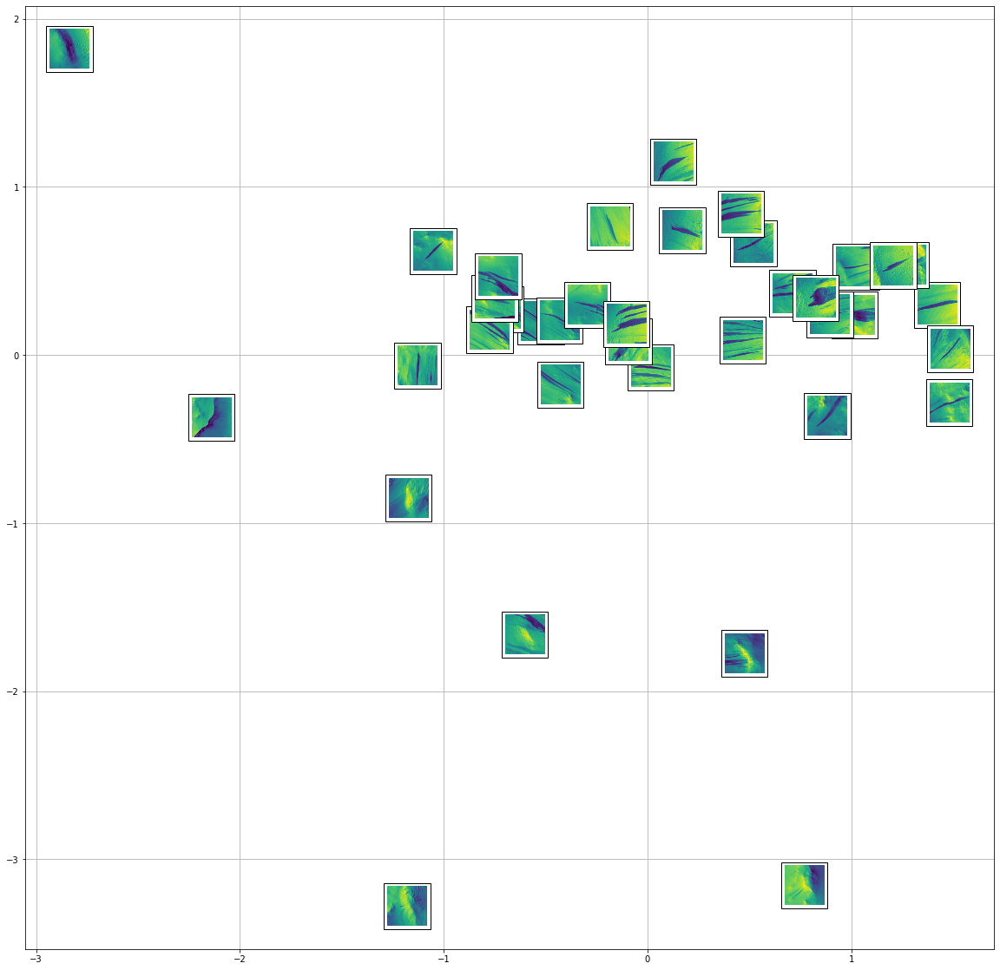

In [36]:
#Perform PCA on only streak images

import numpy as np
import math
import matplotlib.pyplot as plt
import scipy.io as spio
import scipy.sparse.linalg as ll
import sklearn.preprocessing as skpp

data_pca=data_streak.T/255  #each column of data is now an image; the data is also scaled by 255

#Perform PCA

#estimate the mean mu
mu = np.mean(data_pca,axis = 1)
xc = data_pca - mu[:,None] #subtract mu from each x^i; xc has columns x^i-mu
C = np.dot(xc,xc.T)/m  #covariance matrix
K = 2 #set the number of principal components
S,W = ll.eigs(C,k = K)  #eigendecomposition of C;  W[:, i] is the eigenvector corresponding to the eigenvalue S[i].  
                        #S and W are already sorted beginning with the largest eigenvalue
#ignore the complex parts since S and W consist of real numbers
S = S.real 
W = W.real

dim1 = np.dot(W[:,0].T,xc)/math.sqrt(S[0]) # the scores z11,...,zm1 of the first principal component
dim2 = np.dot(W[:,1].T,xc)/math.sqrt(S[1]) # the scores z12,...,zm2 of the second principal component

#plot the scatter plot
plt.figure(1,figsize=(20,20)) #enlarge the plot
plt.scatter(dim1,dim2)

#Add pictures of faces to scatter plot
for i in range(0,m,1):
    ax = plt.subplot(111)
    pic=data_pca[:,i]
    pic=np.reshape(pic,(227,227))
    pic = (pic * 255).astype(np.uint8)
    im = Image.fromarray(pic,mode='L')
    #im = im.rotate(-90)  #rotate the image by 90 degrees
    imagebox = OffsetImage(im, zoom=.2)
    xy = [dim1[i], dim2[i]]               # coordinates to position this image

    ab = AnnotationBbox(imagebox, xy,
        xybox=(.3, -.3),
        xycoords='data',
        boxcoords="offset points")                                  
    ax.add_artist(ab)
ax.grid(True)
plt.draw()
plt.show()

In [56]:
data_iso=data_other/255
np.linalg.norm(data_iso[390,:]-data_iso[150,:]), data_other.shape

(54.94119886355227, (2018, 51529))

<ipython-input-122-c9f063feaaea>:52: RuntimeWarning: invalid value encountered in sqrt
  Z_T=W @ np.diag(np.sqrt(S))
<ipython-input-122-c9f063feaaea>:64: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.subplot(111)


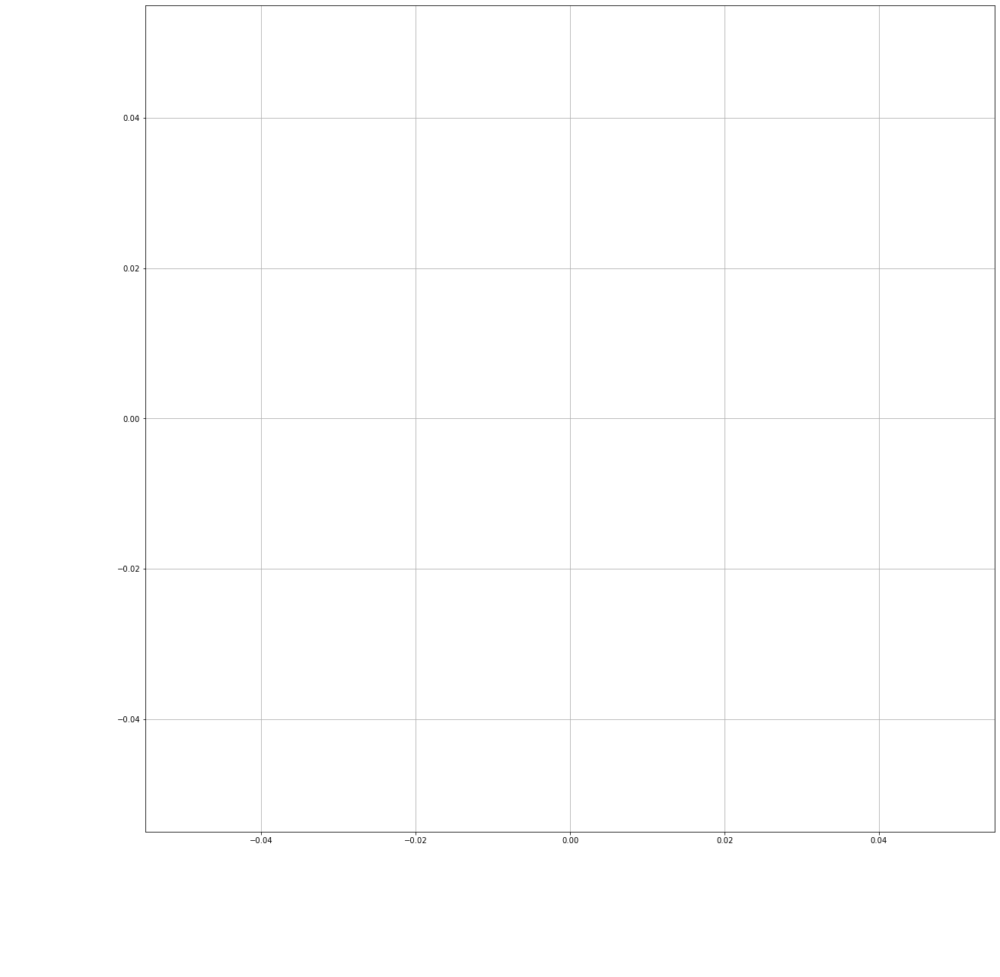

In [122]:
#Perform ISOMAP on only other images

#scale data_other by 255
data_iso=data_other/255

#Perform ISOMAP algorithm on data_other
m=data_iso.shape[0] #the number of nodes
EPSILON=45  #50 seems good

#Perform ISOMAP algorithm

#STEP 1: Create the weighted adjacency matrix A

weights=[]
for i in range(m):
    for j in range(m):
        if j>i:
            if np.linalg.norm(data_iso[i,:]-data_iso[j,:])<=EPSILON:
                w=np.linalg.norm(data_iso[i,:]-data_iso[j,:])
                weights.append([i,j,w])
            else:
                weights.append([i,j,0])

weights=np.array(weights) 
i=weights[:,0]
j=weights[:,1]
v=weights[:,2]
A = sparse.coo_matrix((v, (i, j)), shape=(m,m))
A = (A + np.transpose(A))  #to make sure A is symmetric
A = sparse.csc_matrix.todense(A) # convert to dense matrix

#STEP 2: Compute the shortest distance matrix D
from scipy.sparse.csgraph import shortest_path
D=shortest_path(csgraph=A,directed=False)

# #sample graph for debugging purposes
# A=np.array([[0,1,0,0],[1,0,1,1],[0,1,0,0],[0,1,0,0]])
D= sk.graph_shortest_path(A)

#STEP 3: Compute matrix C
H=np.eye(m)-(1/m)*np.dot(np.matrix(np.ones(m)).T,np.matrix(np.ones(m)))
C=(-1/2)*(H@(D**2)@H)

#STEP 4: Eigendecomposition of C

K = 2 #set the number of dimensions
S,W = ll.eigs(C,k = K)  #eigendecomposition of C;  W[:, i] is the eigenvector corresponding to the eigenvalue S[i].  
                        #S and W are already sorted beginning with the largest eigenvalue
#ignore the complex parts since S and W consist of real numbers
S = S.real 
W = W.real
Z_T=W @ np.diag(np.sqrt(S))  
Z=Z_T.T  #compute the scores
dim1=Z[0,:]
dim2=Z[1,:]

#plotting the data in the low-dimensional space
from matplotlib.offsetbox import AnnotationBbox, OffsetImage
plt.figure(1,figsize=(20,20)) #enlarge the plot
plt.scatter(dim1,dim2)

#Add pictures of orbital images to scatter plot
for i in range(0,m,10): 
    ax = plt.subplot(111)
    pic=data_iso[i,:]
    pic=np.reshape(pic,(227,227))
    pic = (pic*255).astype(np.uint8)
    im = Image.fromarray(pic,mode='L')
    #im = im.rotate(-90)  #rotate the image by 90 degrees
    imagebox = OffsetImage(im, zoom=.20) #.2 is good zoom size
    xy = [dim1[i], dim2[i]]               # coordinates to position this image

    ab = AnnotationBbox(imagebox, xy,
        xybox=(.3, -.3),
        xycoords='data',
        boxcoords="offset points")                                  
    ax.add_artist(ab)
ax.grid(True)
plt.draw()
plt.show()

<ipython-input-60-b0770e805182>:35: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.subplot(111)


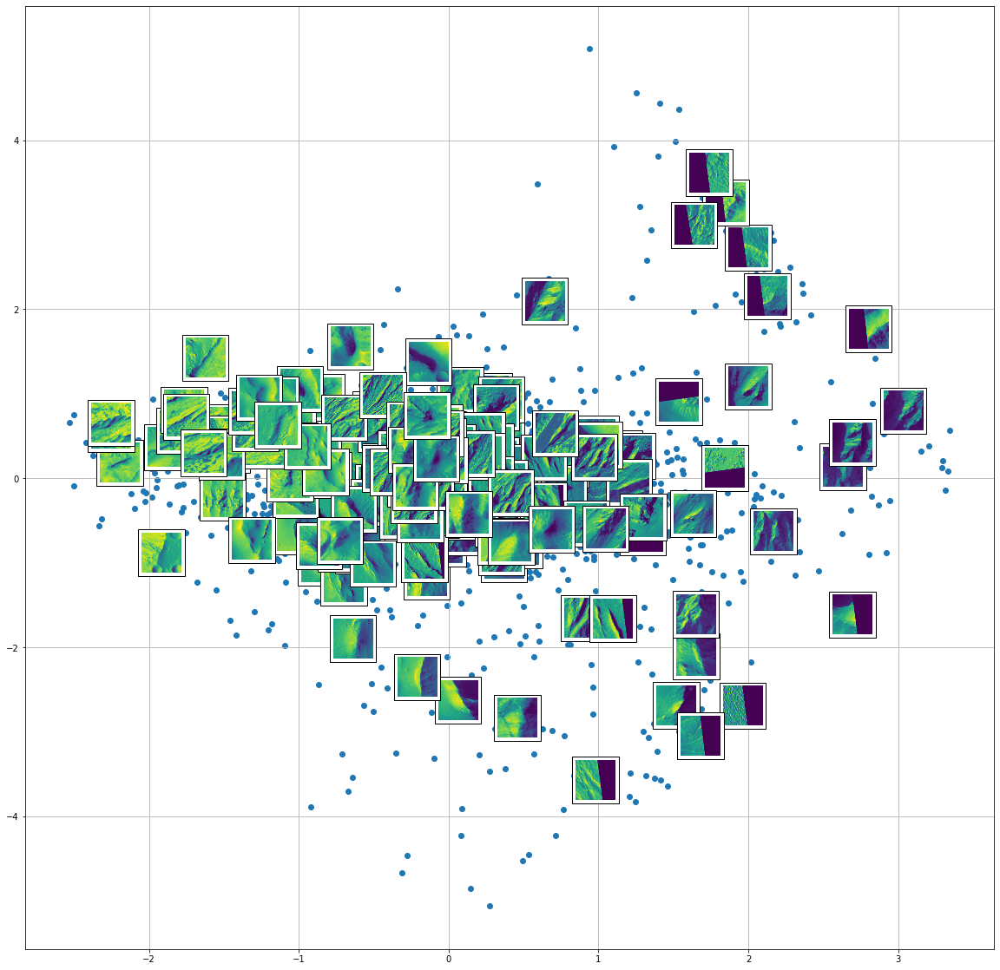

In [60]:
#Perform PCA on only other images

import numpy as np
import math
import matplotlib.pyplot as plt
import scipy.io as spio

import scipy.sparse.linalg as ll
import sklearn.preprocessing as skpp

data_pca=data_other.T/255  #each column of data is now an image; the data is also scaled by 255

#Perform PCA

#estimate the mean mu
mu = np.mean(data_pca,axis = 1)
xc = data_pca - mu[:,None] #subtract mu from each x^i; xc has columns x^i-mu
C = np.dot(xc,xc.T)/m  #covariance matrix
K = 2 #set the number of principal components
S,W = ll.eigs(C,k = K)  #eigendecomposition of C;  W[:, i] is the eigenvector corresponding to the eigenvalue S[i].  
                        #S and W are already sorted beginning with the largest eigenvalue
#ignore the complex parts since S and W consist of real numbers
S = S.real 
W = W.real

dim1 = np.dot(W[:,0].T,xc)/math.sqrt(S[0]) # the scores z11,...,zm1 of the first principal component
dim2 = np.dot(W[:,1].T,xc)/math.sqrt(S[1]) # the scores z12,...,zm2 of the second principal component

#plot the scatter plot
plt.figure(1,figsize=(20,20)) #enlarge the plot
plt.scatter(dim1,dim2)

#Add pictures of faces to scatter plot
for i in range(0,m,10):
    ax = plt.subplot(111)
    pic=data_pca[:,i]
    pic=np.reshape(pic,(227,227))
    pic = (pic * 255).astype(np.uint8)
    im = Image.fromarray(pic,mode='L')
    #im = im.rotate(-90)  #rotate the image by 90 degrees
    imagebox = OffsetImage(im, zoom=.2)
    xy = [dim1[i], dim2[i]]               # coordinates to position this image

    ab = AnnotationBbox(imagebox, xy,
        xybox=(.3, -.3),
        xycoords='data',
        boxcoords="offset points")                                  
    ax.add_artist(ab)
ax.grid(True)
plt.draw()
plt.show()

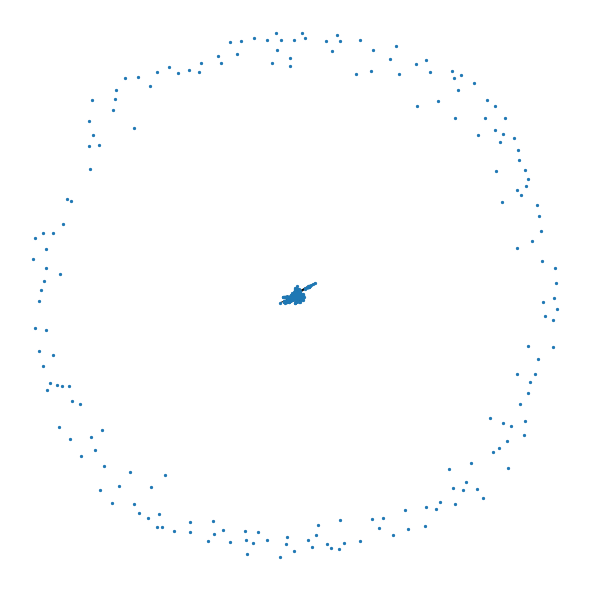

In [124]:
#Plotting the adjacency graph

# importing the required module
import networkx as nx

# making a graph.
G = nx.from_numpy_matrix(A)
random_pos = nx.random_layout(G, seed=40) #40
pos = nx.spring_layout(G, pos=random_pos)
plt.figure(1,figsize=(8,8)) #enlarge the plot
nx.draw(G,pos,node_size=5) 
plt.draw()
plt.show()

In [125]:
list(nx.isolates(G))

[176,
 177,
 184,
 286,
 287,
 494,
 583,
 585,
 647,
 652,
 854,
 855,
 860,
 861,
 870,
 875,
 877,
 878,
 879,
 880,
 881,
 882,
 883,
 886,
 887,
 888,
 889,
 890,
 891,
 893,
 903,
 914,
 959,
 962,
 963,
 965,
 966,
 967,
 968,
 969,
 970,
 971,
 974,
 975,
 983,
 990,
 991,
 1087,
 1088,
 1090,
 1091,
 1092,
 1093,
 1094,
 1105,
 1131,
 1169,
 1172,
 1173,
 1177,
 1344,
 1353,
 1400,
 1484,
 1491,
 1500,
 1555,
 1616,
 1617,
 1618,
 1625,
 1644,
 1646,
 1648,
 1650,
 1651,
 1652,
 1653,
 1656,
 1659,
 1660,
 1661,
 1662,
 1663,
 1664,
 1665,
 1666,
 1668,
 1669,
 1670,
 1671,
 1672,
 1674,
 1675,
 1676,
 1677,
 1679,
 1680,
 1681,
 1682,
 1683,
 1684,
 1685,
 1686,
 1688,
 1689,
 1690,
 1692,
 1693,
 1695,
 1696,
 1698,
 1699,
 1700,
 1702,
 1704,
 1705,
 1707,
 1708,
 1709,
 1711,
 1712,
 1714,
 1715,
 1716,
 1717,
 1718,
 1720,
 1722,
 1723,
 1724,
 1725,
 1727,
 1728,
 1729,
 1732,
 1733,
 1735,
 1736,
 1737,
 1739,
 1740,
 1741,
 1742,
 1743,
 1745,
 1747,
 1748,
 1749,
 175

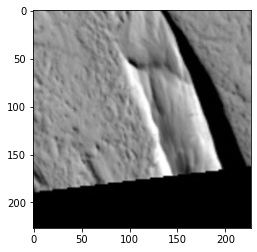

In [121]:
#see a sample image (alternative way)
pic=data_iso[177,:]
pic=np.reshape(pic,(227,227))

fig, axes = plt.subplots(figsize=(4,4))
axes.imshow(pic, cmap='gray')
plt.show()

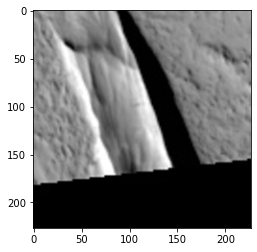

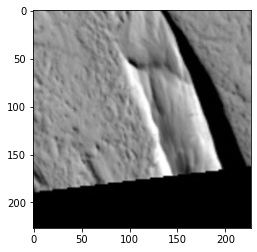

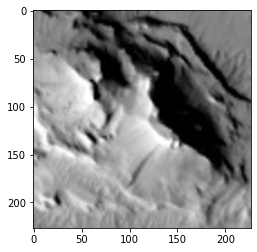

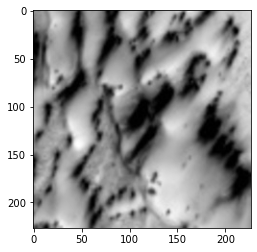

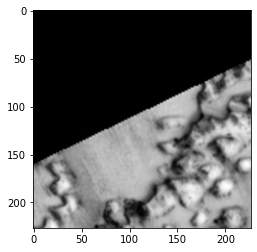

...

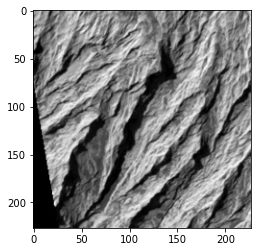

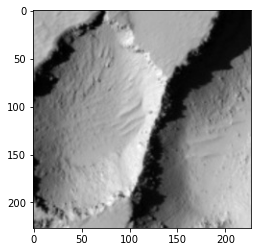

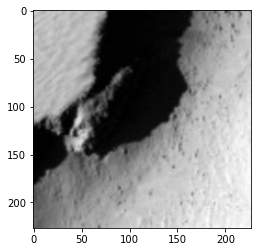

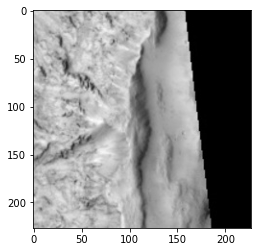

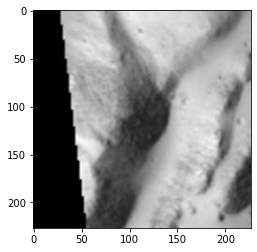

In [126]:
for i in list(nx.isolates(G)):
    #see a sample image (alternative way)
    pic=data_iso[i,:]
    pic=np.reshape(pic,(227,227))

    fig, axes = plt.subplots(figsize=(4,4))
    axes.imshow(pic, cmap='gray')
    plt.show()
    